In [0]:
%pip install vaderSentiment

  Obtaining dependency information for vaderSentiment from https://files.pythonhosted.org/packages/76/fc/310e16254683c1ed35eeb97386986d6c00bc29df17ce280aed64d55537e9/vaderSentiment-3.3.2-py2.py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/126.0 kB ? eta -:--:--
   ━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.7/126.0 kB 819.1 kB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 1.9 MB/s eta 0:00:00
Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
import pandas as pd
import matplotlib.pyplot as plt

from pyspark.sql.functions import col, udf, round, date_format, to_date, to_timestamp, avg, sum
from pyspark.sql.types import DoubleType
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer


In [0]:
df=spark.table('bitcoin_tweets')

PREPROCESSING DEI DATI

In [0]:

df=df.dropna(subset='text')  #togliamo i valori nulli dalla colonna text
df = df.withColumn("timestamp_converted", to_timestamp(col('timestamp'), "yyyy-MM-dd HH:mm:ssX")) # Convertiamo la colonna 'timestamp' nel formato timestamp usando il formato corretto
df = df.withColumn("date", to_date(col("timestamp_converted"))) #dalla colonna timestamp estraiamo la data
df=df.withColumn('replies', col('replies').cast('double')).withColumn('likes', col('likes').cast('double')).withColumn('retweets', col('retweets').cast('double')) #trasformiamo i valori delle colonne replies, likes e retweets in numeri decimali

In [0]:
#ci assicuriamo che le colonne abbiano il formato corretto
df.printSchema()

root
 |-- id: string (nullable = true)
 |-- user: string (nullable = true)
 |-- fullname: string (nullable = true)
 |-- url: string (nullable = true)
 |-- timestamp: string (nullable = true)
 |-- replies: double (nullable = true)
 |-- likes: double (nullable = true)
 |-- retweets: double (nullable = true)
 |-- text: string (nullable = true)
 |-- timestamp_converted: timestamp (nullable = true)
 |-- date: date (nullable = true)



In [0]:
#Verifichiamo l'esito delle trasformazioni
display(df)

id,user,fullname,url,timestamp,replies,likes,retweets,text,timestamp_converted,date
1.1329770553003008e+18,KamdemAbdiel,Abdiel kamdem,null,2019-05-27 11:49:14+00,0.0,0.0,0.0,È appena uscito un nuovo video! LES CRYPTOMONNAIES QUI PULVÉRISENT BITCOIN EN 2019 https://t.co/yCsQMvRnyS,2019-05-27T11:49:14Z,2019-05-27
1.1329770734027366e+18,bitcointe,Bitcointe,null,2019-05-27 11:49:18+00,0.0,0.0,0.0,Cardano: Digitize Currencies; EOS https://t.co/1kTKqKEBlS 6500% ROI; AT&T Bitcoin Bill Pay https://t.co/eQCwOXKHK0 | Cardano (ADA) 🌏📢😎🤑💵 | #FolloForFolloBack #follo4folloback #followforfollow #bitcointe #cryptocurrency,2019-05-27T11:49:18Z,2019-05-27
1.1329770238931396e+18,3eyedbran,Bran - 3 Eyed Raven,null,2019-05-27 11:49:06+00,0.0,2.0,1.0,Another Test tweet that wasn't caught in the stream ! bitcoin,2019-05-27T11:49:06Z,2019-05-27
1.1329770890895564e+18,DetroitCrypto,J. Scardina,null,2019-05-27 11:49:22+00,0.0,0.0,0.0,Current Crypto Prices!,2019-05-27T11:49:22Z,2019-05-27
1.1329770923401912e+18,mmursaleen72,Muhammad Mursaleen,null,2019-05-27 11:49:23+00,0.0,0.0,0.0,Spiv (Nosar Baz): BITCOIN Is An Asset & NOT A Currency.,2019-05-27T11:49:23Z,2019-05-27
1.1329771003093196e+18,0nurTOKA,🐻🔫💥🐂🚀🙏,null,2019-05-27 11:49:25+00,0.0,0.0,0.0,"#btc inceldiği yerden kopsun bakalım 17:00 ye kadar bir hareket bekliyorum, yukarı yönlü olur umarın sanırım inşallah yani 😁 https://t.co/pIMyKfNtc8",2019-05-27T11:49:25Z,2019-05-27
1.1329771016388977e+18,evilrobotted,evilrobotted,null,2019-05-27 11:49:25+00,0.0,0.0,0.0,@nwoodfine We have been building on the real #bitcoin SV.,2019-05-27T11:49:25Z,2019-05-27
1.1329771088363232e+18,jabur_guilherme,Guilherme Jabur,null,2019-05-27 11:49:27+00,0.0,0.0,0.0,"@pedronauck como investidor, vc é um ótimo dev. Sorte q eu comprei os BTC, subiu a poha toda :o",2019-05-27T11:49:27Z,2019-05-27
1.1329771318503506e+18,INTBICON,億り人彼氏,null,2019-05-27 11:49:32+00,0.0,0.0,0.0,ブラジルはまぁ置いといてもドイツは存在感出してくるのかな。ロシアもマイニングなどで元気になるかと思ったらそこまででしたね。,2019-05-27T11:49:32Z,2019-05-27
1.1329771327145615e+18,MLWright15,ML Wright,null,2019-05-27 11:49:32+00,0.0,0.0,0.0,"CHANGE IS COMING...GET READY!!! Boom, Another [CB] Jab, Nothing Can Stop This! Globalism at its end stage, [CB] push to make a one world govt. coming to an end.",2019-05-27T11:49:32Z,2019-05-27


UTILIZZO DI VADER PER L'ANALISI DEL SENTIMENT

In [0]:
# Inizializiamo VADER
analyzer = SentimentIntensityAnalyzer()

# Creiamo la funzione per calcolare il sentiment
def analyze_sentiment_vader(tweet):
    vs = analyzer.polarity_scores(tweet)
    return vs['compound']

# Registriamo la funzione come UDF con DoubleType
analyze_sentiment_vader_udf = udf(analyze_sentiment_vader, DoubleType())

#Applichiamo la UDF alla colonna 'text' per creare una nuova colonna 'sentiment e arrotondiamo a 2 cifre decimali'
df_with_sentiment = df.withColumn('sentiment', round(analyze_sentiment_vader_udf(df['text']),2))

# Mostriamo il risultato
display(df_with_sentiment)

id,user,fullname,url,timestamp,replies,likes,retweets,text,timestamp_converted,date,sentiment
1.1329770553003008e+18,KamdemAbdiel,Abdiel kamdem,null,2019-05-27 11:49:14+00,0.0,0.0,0.0,È appena uscito un nuovo video! LES CRYPTOMONNAIES QUI PULVÉRISENT BITCOIN EN 2019 https://t.co/yCsQMvRnyS,2019-05-27T11:49:14Z,2019-05-27,0.0
1.1329770734027366e+18,bitcointe,Bitcointe,null,2019-05-27 11:49:18+00,0.0,0.0,0.0,Cardano: Digitize Currencies; EOS https://t.co/1kTKqKEBlS 6500% ROI; AT&T Bitcoin Bill Pay https://t.co/eQCwOXKHK0 | Cardano (ADA) 🌏📢😎🤑💵 | #FolloForFolloBack #follo4folloback #followforfollow #bitcointe #cryptocurrency,2019-05-27T11:49:18Z,2019-05-27,0.38
1.1329770238931396e+18,3eyedbran,Bran - 3 Eyed Raven,null,2019-05-27 11:49:06+00,0.0,2.0,1.0,Another Test tweet that wasn't caught in the stream ! bitcoin,2019-05-27T11:49:06Z,2019-05-27,0.0
1.1329770890895564e+18,DetroitCrypto,J. Scardina,null,2019-05-27 11:49:22+00,0.0,0.0,0.0,Current Crypto Prices!,2019-05-27T11:49:22Z,2019-05-27,0.0
1.1329770923401912e+18,mmursaleen72,Muhammad Mursaleen,null,2019-05-27 11:49:23+00,0.0,0.0,0.0,Spiv (Nosar Baz): BITCOIN Is An Asset & NOT A Currency.,2019-05-27T11:49:23Z,2019-05-27,0.36
1.1329771003093196e+18,0nurTOKA,🐻🔫💥🐂🚀🙏,null,2019-05-27 11:49:25+00,0.0,0.0,0.0,"#btc inceldiği yerden kopsun bakalım 17:00 ye kadar bir hareket bekliyorum, yukarı yönlü olur umarın sanırım inşallah yani 😁 https://t.co/pIMyKfNtc8",2019-05-27T11:49:25Z,2019-05-27,0.46
1.1329771016388977e+18,evilrobotted,evilrobotted,null,2019-05-27 11:49:25+00,0.0,0.0,0.0,@nwoodfine We have been building on the real #bitcoin SV.,2019-05-27T11:49:25Z,2019-05-27,0.0
1.1329771088363232e+18,jabur_guilherme,Guilherme Jabur,null,2019-05-27 11:49:27+00,0.0,0.0,0.0,"@pedronauck como investidor, vc é um ótimo dev. Sorte q eu comprei os BTC, subiu a poha toda :o",2019-05-27T11:49:27Z,2019-05-27,-0.1
1.1329771318503506e+18,INTBICON,億り人彼氏,null,2019-05-27 11:49:32+00,0.0,0.0,0.0,ブラジルはまぁ置いといてもドイツは存在感出してくるのかな。ロシアもマイニングなどで元気になるかと思ったらそこまででしたね。,2019-05-27T11:49:32Z,2019-05-27,0.0
1.1329771327145615e+18,MLWright15,ML Wright,null,2019-05-27 11:49:32+00,0.0,0.0,0.0,"CHANGE IS COMING...GET READY!!! Boom, Another [CB] Jab, Nothing Can Stop This! Globalism at its end stage, [CB] push to make a one world govt. coming to an end.",2019-05-27T11:49:32Z,2019-05-27,0.74


ANALISI DEI DATI

Verifichiamo la distribuzione del sentiment

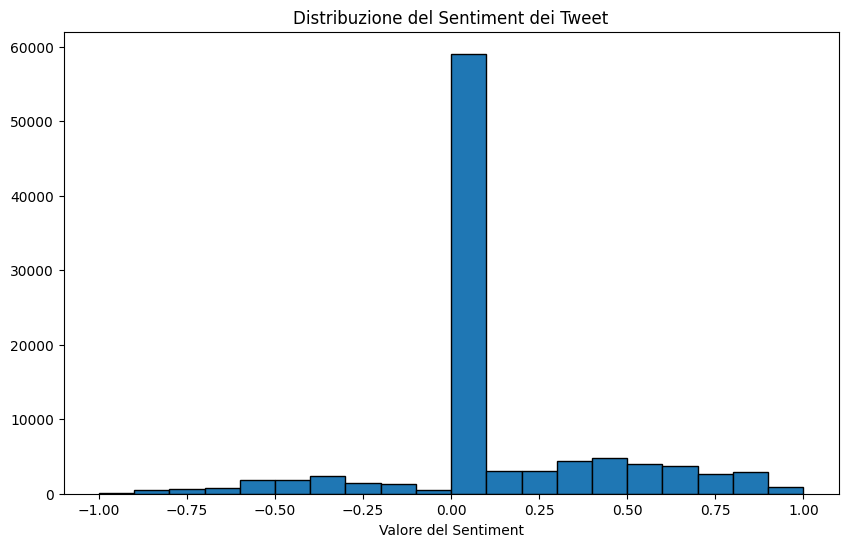

Il grafico ci mostra una distribuzione molto concentrata nei valori che vanno da 0 a 0,1, questo probabilmente è dovuto al fatto che la libreria VADER non gestisce in maniera efficiente i tweet in lingue diverse dall inglese, decidiamo comunque di considerare tali valori come positivi e ci aspettiamo nella nostra analisi di trovare più tweet positivi che negativi.


In [0]:
# Estraiamo i dati di sentiment
sentiment_data = df_with_sentiment.select("sentiment").rdd.flatMap(lambda x: x).collect()

# Creiamo l'istogramma
plt.figure(figsize=(10, 6))
plt.hist(sentiment_data, bins=20, edgecolor='black')
plt.title('Distribuzione del Sentiment dei Tweet')
plt.xlabel('Valore del Sentiment')
plt.show()

print('Il grafico ci mostra una distribuzione molto concentrata nei valori che vanno da 0 a 0,1, questo probabilmente è dovuto al fatto che la libreria VADER non gestisce in maniera efficiente i tweet in lingue diverse dall inglese, decidiamo comunque di considerare tali valori come positivi e ci aspettiamo nella nostra analisi di trovare più tweet positivi che negativi.')


Variazione giornaliera del sentiment

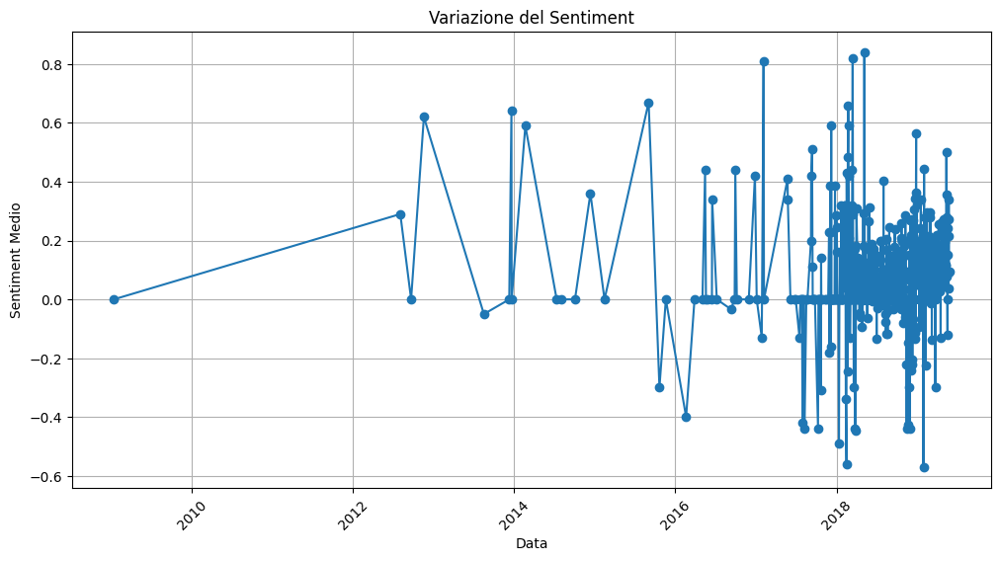

In [0]:

# Calcoliamo il sentiment medio per ciascun giorno, raggruppando e ordinando per la colonna 'date'
daily_sentiment = df_with_sentiment.groupBy('date').agg(avg('sentiment').alias('avg_sentiment')).orderBy('date')

# Estraiamo i dati per creare il grafico
dates = daily_sentiment.select('date').rdd.flatMap(lambda x: x).collect()
avg_sentiments = daily_sentiment.select('avg_sentiment').rdd.flatMap(lambda x: x).collect()

# Crea il grafico a linee
plt.figure(figsize=(12, 6))
plt.plot(dates, avg_sentiments, marker='o', linestyle='-')
plt.title('Variazione del Sentiment')
plt.xlabel('Data')
plt.ylabel('Sentiment Medio')
plt.xticks(rotation=45)
plt.grid()
plt.show()


I tweet sono più frequenti dopo il 2017 quindi filtriamo i dati

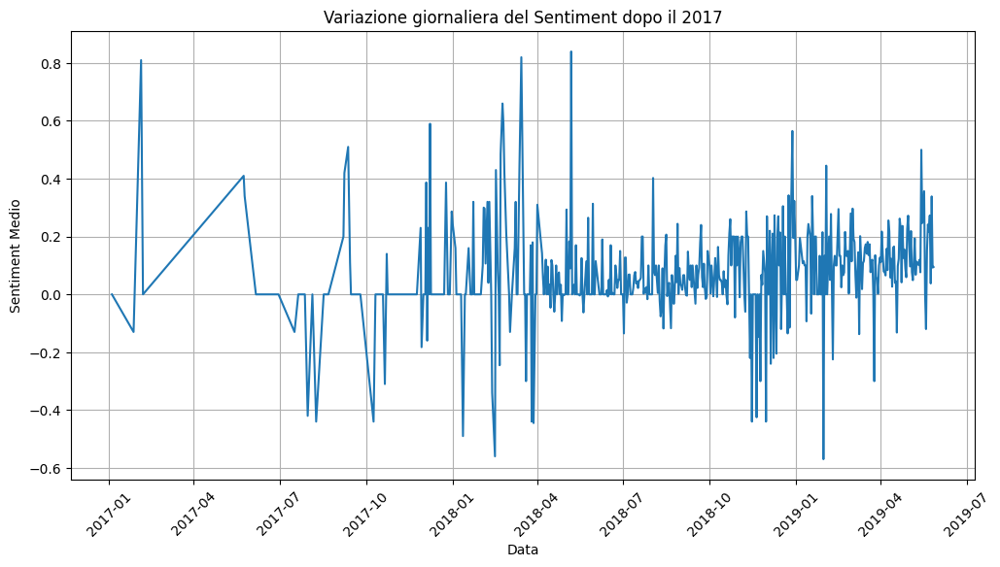

Anche in questo caso si nota una maggiore concentrazione del numero di tweet nella fascia di sentiment da 0 a 0.2


In [0]:
#filtriamo i dati dal 2017 in avanti
start_date='2017-01-01'
daily_sentiment_filtered = daily_sentiment.filter(daily_sentiment['date'] > start_date)

# Estraiamo i dati per creare il grafico
dates = daily_sentiment_filtered.select('date').rdd.flatMap(lambda x: x).collect()
avg_sentiments = daily_sentiment_filtered.select('avg_sentiment').rdd.flatMap(lambda x: x).collect()

# Crea il grafico a linee
plt.figure(figsize=(12, 6))
plt.plot(dates, avg_sentiments, linestyle='-')
plt.title('Variazione giornaliera del Sentiment dopo il 2017')
plt.xlabel('Data')
plt.ylabel('Sentiment Medio')
plt.xticks(rotation=45)
plt.grid()
plt.show()

print('Anche in questo caso si nota una maggiore concentrazione del numero di tweet nella fascia di sentiment da 0 a 0.2')

Verifichiamo il rapporto tra sentiment e numero di likes e risposte

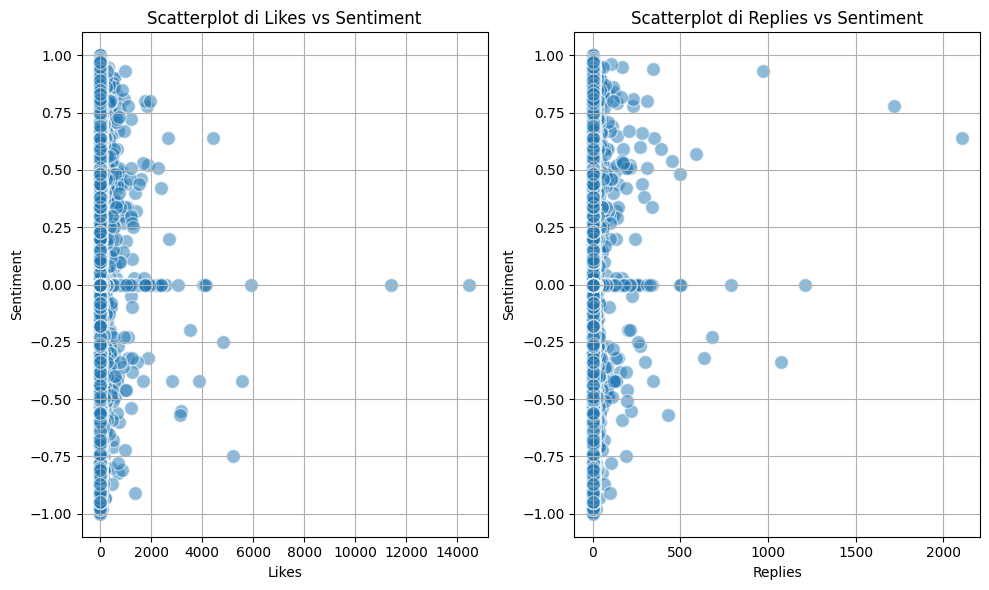

I grafici mostrano come ci aspettavamo, anche se non in una maniera estremamente chiara che i tweet con sentiment positivo maggiore di zero (parte alta dei grafici) hanno più like e replies di quelli negativi (parte bassa dei grafici)


In [0]:
#Estraimo i likes e le replies
likes = df_with_sentiment.select('likes').rdd.flatMap(lambda x: x).collect()
replies = df_with_sentiment.select('replies').rdd.flatMap(lambda x: x).collect()

plt.figure(figsize=(10, 6))

plt.subplot(1,2,1)
plt.scatter(likes, sentiment_data, alpha=0.5, edgecolors='w', s=100)
plt.title('Scatterplot di Likes vs Sentiment')
plt.ylabel('Sentiment')
plt.xlabel('Likes')
plt.grid()

plt.subplot(1,2,2)
plt.scatter(replies, sentiment_data, alpha=0.5, edgecolors='w', s=100)
plt.title('Scatterplot di Replies vs Sentiment')
plt.ylabel('Sentiment')
plt.xlabel('Replies')
plt.grid()

plt.tight_layout()
plt.show()
print('I grafici mostrano come ci aspettavamo, anche se non in una maniera estremamente chiara che i tweet con sentiment positivo maggiore di zero (parte alta dei grafici) hanno più like e replies di quelli negativi (parte bassa dei grafici)')

Proviamo a contare il numero di like e replies positivi e negativi


In [0]:
# Separariamo i dati in sentiment positivo e negativo. Escludiamo i tweet con sentiment neutro uguale a 0
positive_sentiment = df_with_sentiment.filter(df_with_sentiment['sentiment'] > 0)
negative_sentiment = df_with_sentiment.filter(df_with_sentiment['sentiment'] < 0)

positive_likes = 234052.0
negative_likes = 123784.0
positive_replies = 33389.0
negative_replies = 14669.0

Il grafico mostra chiaramente come i bitcoin abbiano un gradimento generalmente positivo. Possiamo quindi affermare e confermare che i tweet positivi hanno avuto molti più likes e interazioni rispetto a quelli negativi.


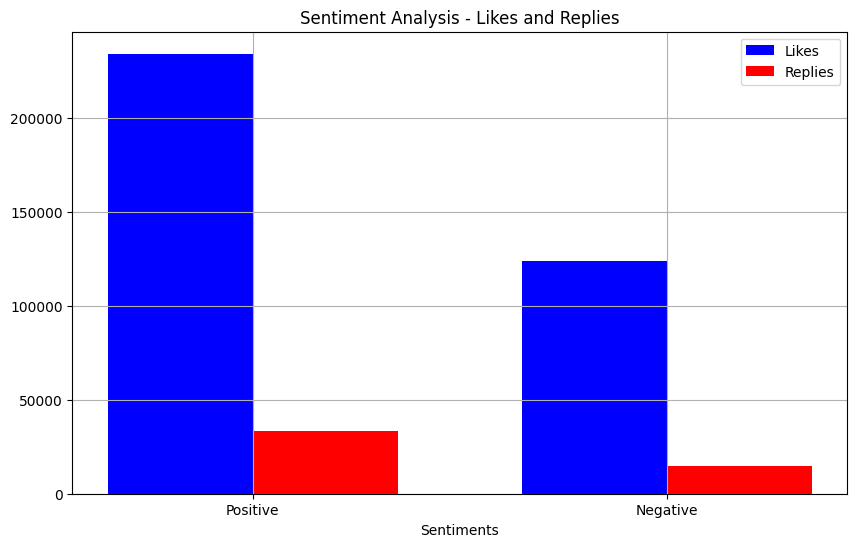

In [0]:
import numpy as np

# Calcoliamo il totale dei like e delle risposte per i sentiment positivi
positive_sum = positive_sentiment.agg(
    sum('likes').alias('total_likes_positive'),
    sum('replies').alias('total_replies_positive')
).collect()[0]

# Calcoliamo il totale dei like e delle risposte per i sentiment negativi
negative_sum = negative_sentiment.agg(
    sum('likes').alias('total_likes_negative'),
    sum('replies').alias('total_replies_negative')
).collect()[0]

print('positive_likes =', positive_sum['total_likes_positive'])
print('negative_likes =', negative_sum['total_likes_negative'])

print('positive_replies =', positive_sum['total_replies_positive'])
print('negative_replies =', negative_sum['total_replies_negative'])
print()
print('Il grafico mostra chiaramente come i bitcoin abbiano un gradimento generalmente positivo. Possiamo quindi affermare e confermare che i tweet positivi hanno avuto molti più likes e interazioni rispetto a quelli negativi.')

# Dati per il grafico
categories = ['Positive', 'Negative']
like_values = [positive_sum['total_likes_positive'], negative_sum['total_likes_negative']]
reply_values = [positive_sum['total_replies_positive'], negative_sum['total_replies_negative']]

# Creiamo il grafico a barre
fig, ax = plt.subplots(figsize=(10, 6))

bar_width = 0.35
index = np.arange(len(categories))

bar1 = ax.bar(index, like_values, bar_width, label='Likes', color='b')
bar2 = ax.bar(index + bar_width, reply_values, bar_width, label='Replies', color='r')

ax.set_xlabel('Sentiments')
ax.set_title('Sentiment Analysis - Likes and Replies')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(categories)
ax.legend()

plt.grid()
plt.show()

Avrei voluto integrare il progetto con questo codice con l'intento di tradurre i tweet in lingua inglese, in questo modo mi aspettavo di migliorare l'analisi del sentiment con vader ottendendo un'analisi più accurata. Purtroppo non sono mai riuscita a visualizzare il dataframe finale e i vari grafici perché i tempi di calcolo sono troppo lunghi. Ho quindi deciso di tenere i dati com'erano e proseguire l'analisi.

In [0]:
%pip install requests langdetect

import requests
from langdetect import detect
from pyspark.sql.functions import pandas_udf
from pyspark.sql.types import StringType
import pyspark.sql.functions as F

from typing import Iterator, Tuple

# Funzione per tradurre i tweet
def translate_tweet(tweet: str, target_language: str = 'en') -> str:
    try:
        source_language = detect(tweet)
        url = "https://api.mymemory.translated.net/get"
        params = {
            "q": tweet,
            "langpair": f"{source_language}|{target_language}"
        }
        response = requests.get(url, params=params)
        
        if response.status_code == 200:
            result = response.json()
            return result['responseData']['translatedText']
        else:
            print(f"Errore HTTP: {response.status_code}")
            return None
    except Exception as e:
        print(f"Errore durante la traduzione: {e}")
        return None


# Crea una UDF Pandas per la traduzione
@pandas_udf(StringType())
def translate_tweet_udf(tweet_series: pd.Series) -> pd.Series:
    return tweet_series.apply(translate_tweet)

# Assumi che df sia il tuo DataFrame Spark esistente
# df = <il tuo DataFrame Spark>

# Applica la UDF di traduzione al DataFrame Spark
df_translated = df.withColumn('translated_text', translate_tweet_udf(df['text']))

# Inizializza VADER
analyzer = SentimentIntensityAnalyzer()

# Creiamo la funzione per calcolare il sentiment
def analyze_sentiment_vader(tweet: str) -> float:
    if tweet is not None:
        vs = analyzer.polarity_scores(tweet)
        return vs['compound']
    else:
        return None


# Registriamo la funzione come UDF con DoubleType
analyze_sentiment_vader_udf = udf(analyze_sentiment_vader, DoubleType())

# Applichiamo la UDF alla colonna 'translated_text' per creare una nuova colonna 'sentiment e arrotondiamo a 2 cifre decimali'
df_with_sentiment = df_translated.withColumn('sentiment', round(analyze_sentiment_vader_udf(df_translated['translated_text']), 2))

# Mostriamo il risultato
display(df_with_sentiment)